# 2D Linear elasticity

We will solve the equations of linear elasticity with FEniCS:

\begin{alignat}{2}
-\nabla\cdot\sigma_{(u)} &= f \quad && \text{in } \Omega \\
u &= u_{\mathrm{L}} \quad && \text{on } \Gamma_{\mathrm{L}} \\
u &= u_{\mathrm{R}} \quad && \text{on } \Gamma_{\mathrm{R}} \\
\sigma\cdot n &= g \quad && \text{on } \Gamma_{\mathrm{N}}
\end{alignat}

where $\sigma(u) = 2\mu\varepsilon(u) + \lambda\mathrm{tr}(\varepsilon(u)) I$ is the Cauchy stress tensor, $\varepsilon(u) = \frac{1}{2}(\nabla u + (\nabla u)^{\top})$ is the strain tensor (symmetric gradient) and $I$ is the identity matrix.

This is a model of linear elastic materials in the idealized case of infinitesimal (small) displacements.

We will use the following data:

* $\Omega = (0,5)\times(0,1)$
* $E = 206180\,\mathrm{[MPa]}$ (Young's Modulus for steel)
* $\nu = 0.3\,$ (Poisson's ratio for steel)
* $f = (0,0)$
* $\Gamma_{\mathrm{L}} = \{(x,y) \in \partial\Omega \mid x = 0\}$ (the left boundary)
* $\Gamma_{\mathrm{R}} = \{(x,y) \in \partial\Omega \mid x = 5\}$ (the right boundary)
* $\Gamma_{\mathrm{N}} = \partial\Omega \setminus (\Gamma_{\mathrm{L}} \cup \Gamma_{\mathrm{R}})$
* $u_{\mathrm{L}} = (0,0)$ (fixed)
* $u_{\mathrm{R}} = (0.001,0)$ (stretched)
* $g = (0,0)$

Compute the Lamé parameters $\mu$ and $\lambda$ from the shear modulus and bulk modulus. The given values are those of steel scaled down by a factor $10^6$.

For hints and more reading on how to solve this problem in FEniCS, see the [section on the equations of linear elasticity](https://fenicsproject.org/pub/tutorial/html/._ftut1008.html#ftut:elast) in the [FEniCS Tutorial](https://fenicsproject.org/tutorial/).

### Importing FEniCS and useful libraries

We import `FEniCS` and the meshing library `mshr`. We also import `matplotlib` to make some plots and `numpy`.

In [28]:
from fenics import *
from mshr import *
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

### Creating the mesh 

We create the mesh by using boolean operator from `mshr`. We define a rectangle and a circle and then we set difference btw them.

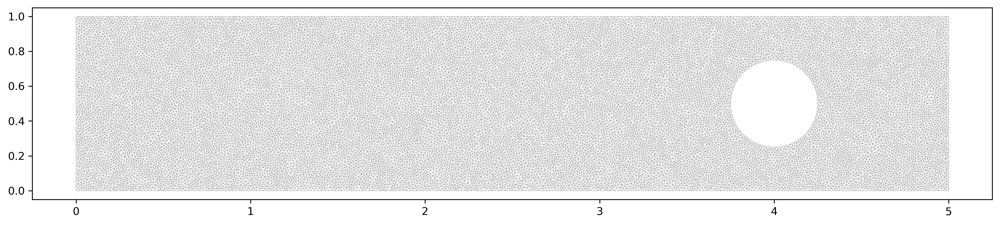

In [29]:
l, h = 5., 1. # lenght, height
r = 0.25 # radious
N = 200 # mesh density

S0 = Rectangle(Point(0, 0), Point(l, h))
C0 = Circle(Point(4, 0.5), r)
domain = S0 - C0 

mesh = generate_mesh(domain, N)

plt.figure(figsize = (16,9), dpi=300)
plot(mesh, linewidth = 0.2)

## Defining the finite element function space
When we have created the mesh, we can define the finite element function space. Since we will be solving a system of equations for $u = (u_x, u_y)$, we create a $P_1$ *vector* function space

In [3]:
V = VectorFunctionSpace(mesh, 'P', degree = 1)

## Defining the boundary conditions
The boundary conditions can be defined by specifying all points on the boundary close to either of the two end points $x = 0$ and $x = 5$. Use two `DirichletBC` objects to define the two boundary conditions. Note that the traction boundary condition $g = 0$ is a natural boundary condition and so does not need to be implemented as a Dirichlet boundary condition.

In [4]:
def left(x, on_boundary):
    return near(x[0], 0) and on_boundary

def right(x, on_boundary):
    return near(x[0], 5) and on_boundary

u_L = Constant((0,0)) # Left
u_R = Constant((0.001, 0)) # Right 

bc_L = DirichletBC(V, u_L, left)
bc_R = DirichletBC(V, u_R, right)

bcs = [bc_L, bc_R]

## Defining the variational problem
The finite element variational problem for the linear elasticy problem reads: Find $u \in V$ such that
$$
\int_{\Omega} \sigma(u) : \varepsilon(v) \,\mathrm{d}x
=
\int_{\Omega} f \cdot v \,\mathrm{d}x
$$
for all $v \in V$.

This can be expressed in FEniCS by defining the *bilinear form* $a$ and the *linear form* $L$:

\begin{align}
  a(u, v) &= \int_{\Omega} \sigma(u) : \varepsilon(v) \,\mathrm{d}x, \\
  L(v) &= \int_{\Omega} f \cdot v \,\mathrm{d}x.
\end{align}

where $\sigma(u) = 2\mu\varepsilon(u) + \lambda\mathrm{tr}(\varepsilon(u)) I$ and $\varepsilon(u) = \frac{1}{2}(\nabla u + (\nabla u)^{\top})$. Note that both $\sigma$ and $\varepsilon$ may be conveniently expressed as Python functions using the `def` keyword.

In [5]:
E = Constant(206180) # Young's Modulus [MPa]
nu = Constant(0.3) # Poisson coefficient
model = 'plane_stress'
d = 2 # Dimension

mu = E/2/(1+nu)
lmbda = E*nu/(1+nu)/(1-2*nu)

def eps(v):
    return sym(grad(v))

if model == 'plane_stress':
    lmbda = 2*mu*lmbda/(lmbda+2*mu)
    
def sigma(v):
    return lmbda*tr(eps(v))*Identity(d) + 2.0*mu*eps(v)

In [6]:
f = Constant((0, 0)) # Source term
u = TrialFunction(V)
v = TestFunction(V)

# We define the bilinear and linear form
a = inner(sigma(u), eps(v))*dx
L = inner(f, v)*dx

## Solving the variational problem
As an alternative to calling the `solve()` function, we manually assemble the linear system, apply the boundary conditions and solve the linear system.

In [7]:
u = Function(V, name = 'Displacement')
solve(a == L, u, bcs)

## Von Mises Stress
As soon as the displacement $u$ is computed, we can compute various stress measures. We will compute the von Mises stress defined as:

$$ \sigma_M = \sqrt{\frac{3}{2}s:s} $$

Where $s$ is the deviatoric stress tensor:

$$ s = \sigma - \frac{1}{3} tr(\sigma) I $$

The colon operator (:) is the inner product between tensors.

The _von Mises_ variable is now an expression that must be projecto to a finite element space (V) before we can visualize it.

In [8]:
s = dev(sigma(u)) # Deviatoric stress
sv = sqrt(1.5*inner(s, s)) # Von Mises Stress

# Computing the Average VMS
sv_avg = assemble(sv*dx) / assemble(1*dx(mesh))
print('Average Von Mises Stress = %.2f' % (sv_avg), 'MPa')

# Computing the Max. VMS
W = FunctionSpace(mesh, 'DG', 0)
sv = project(sv, W)
sv_max = sv.vector().norm('linf')
print('Max. Von Mises Stress = %.2f' % (sv_max), 'MPa')

# Compute the maximum strain
max_strain = (np.abs(u.vector().get_local()).max() / 5)*100
print('Max. Strain = %.2f' % (max_strain), '%')

Average Von Mises Stress = 32.29 MPa
Max. Von Mises Stress = 134.00 MPa
Max. Strain = 0.02 %


In [9]:
File('traction2/displacement.pvd') << u
File('traction2/von_mises.pvd') << sv

## Plotting the solutions:

We can use the `plot` command to visualize the solution.

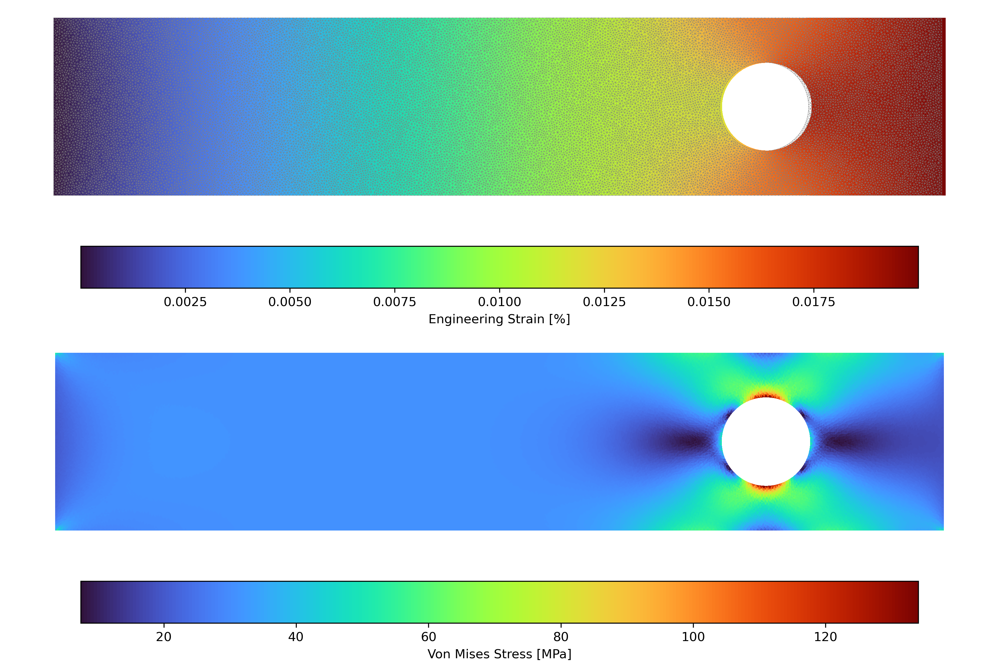

In [18]:
plt.figure(figsize = (16,9), dpi=300)

plt.subplot(211)
p0 = plot((u/l)*100, cmap = 'turbo', mode='displacement') # Sin " mode = 'displacement' " se ven los vectores.
plt.colorbar(p0, label = 'Engineering Strain [%]', orientation='horizontal')
plot(mesh, linewidth = 0.2)
plt.axis('off')

plt.subplot(212)
p1 = plot(sv, cmap = 'turbo')
plt.colorbar(p1, label = 'Von Mises Stress [MPa]', orientation='horizontal')
plt.axis('off')

filename = 'traction2/fig1.png'
plt.savefig(filename, dpi=300)

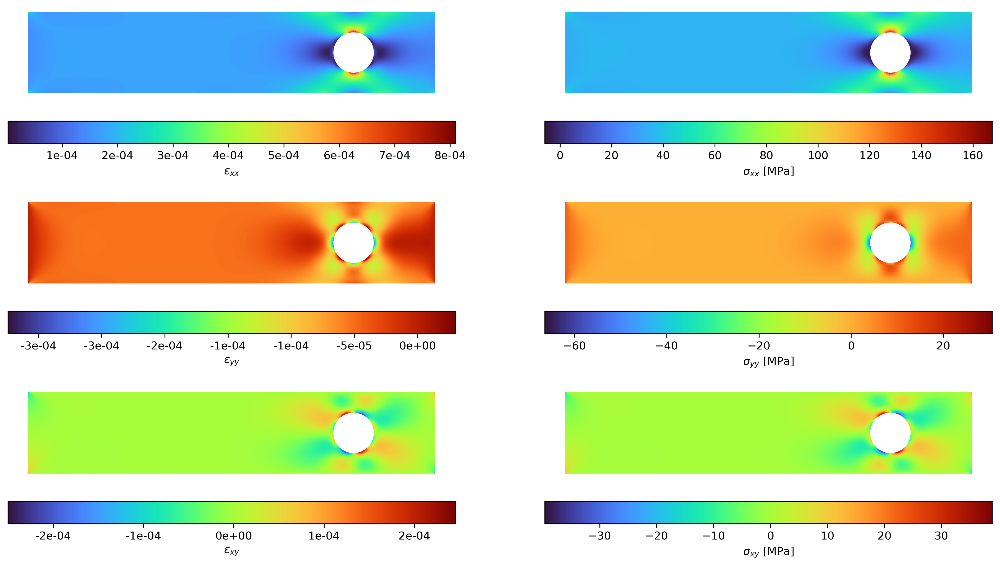

In [12]:
plt.figure(figsize = (16,9), dpi=300)

plt.subplot(321)
p2 = plot((eps(u)[0,0]), cmap = 'turbo', mode = 'color')
plt.colorbar(p2, label = r'$\varepsilon_{xx}$', orientation='horizontal',  format='%.0e')
plt.axis('off')

plt.subplot(322)
p3 = plot(sigma(u)[0,0], cmap = 'turbo', mode = 'color')
plt.colorbar(p3, label = r'$\sigma_{xx}$ [MPa]', orientation='horizontal')
plt.axis('off')

plt.subplot(323)
p4 = plot((eps(u)[1,1]), cmap = 'turbo', mode = 'color')
plt.colorbar(p4, label = r'$\varepsilon_{yy}$', orientation='horizontal', format='%.0e')
plt.axis('off')

plt.subplot(324)
p5 = plot(sigma(u)[1,1], cmap = 'turbo', mode = 'color')
plt.colorbar(p5, label = r'$\sigma_{yy}$ [MPa]', orientation='horizontal')
plt.axis('off')

plt.subplot(325)
p6 = plot((eps(u)[0,1]), cmap = 'turbo', mode = 'color')
plt.colorbar(p6, label = r'$\varepsilon_{xy}$', orientation='horizontal', format='%.0e')
plt.axis('off')

plt.subplot(326)
p7 = plot(sigma(u)[0,1], cmap = 'turbo', mode = 'color')
plt.colorbar(p7, label = r'$\sigma_{xy}$ [MPa]', orientation='horizontal')
plt.axis('off')

filename = 'traction2/fig2.png'
plt.savefig(filename, dpi=300)